<a href="https://colab.research.google.com/github/Naditya206/PCVK/blob/main/Week6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Preparation

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import math
from PIL import Image
import torch
import torch.nn as nn
from typing import List, Tuple

# Praktikum 1 - Konvolusi tanpa Library

In [ ]:
def convolution2d(
    image: np.ndarray,
    kernel: np.ndarray,
    stride: int = 1,
    padding: int = 0
) -> np.ndarray:
    """
    Perform 2D convolution on an image with a given kernel.

    Args:
        image: Input image as numpy array (H x W) or (H x W x C)
        kernel: Convolution kernel as numpy array (K_H x K_W)
        stride: Step size for convolution (default: 1)
        padding: Number of pixels to pad around the image (default: 0)

    Returns:
        Convolved image as numpy array
    """
    # Handle grayscale and color images
    if len(image.shape) == 3:
        # For color images, apply convolution to each channel
        result = np.zeros_like(image)
        for c in range(image.shape[2]):
            result[:,:,c] = convolution2d(image[:,:,c], kernel, stride, padding)
        return result

    # Get dimensions
    img_height, img_width = image.shape
    kernel_height, kernel_width = kernel.shape

    # Apply padding
    if padding > 0:
        padded_image = np.pad(
            array=image,
            pad_width=padding,
            mode='constant',
            constant_values=0
        )
    else:
        padded_image = image

    # Calculate output dimensions
    output_height = (padded_image.shape[0] - kernel_height) // stride + 1
    output_width = (padded_image.shape[1] - kernel_width) // stride + 1

    # Initialize output
    output = np.zeros((output_height, output_width))

    # Perform convolution
    for i in range(0, output_height):
        for j in range(0, output_width):
            # Extract region of interest
            start_i = i * stride
            start_j = j * stride
            roi = padded_image[
                start_i:start_i + kernel_height,start_j:start_j + kernel_width
            ]

            # Element-wise multiplication and sum
            output[i, j] = np.sum(roi * kernel)

    return output

In [ ]:
kernel_size = 21
sigma = math.sqrt(kernel_size)

kernels = {
    'sharpen' : np.array([
        [0, -1, 0],
        [-1, 5, -1],
        [0, -1, 0]
    ]),
    'emboss' : np.array([
        [-2, -1, 0],
        [-1, 1, 1],
        [0, 1, 2]
    ]),
    'left-sobel-edge' : np.array([
        [1, 0, -1],
        [2, 1, -2],
        [1, 0, -1]
    ]),
    'canny-edge' : np.array([
        [-1, -1, -1],
        [-1, 8, -1],
        [-1, -1, -1]
    ]),
    'gaussian' : cv2.getGaussianKernel(kernel_size, sigma).dot(cv2.getGaussianKernel(kernel_size, sigma).T)
}

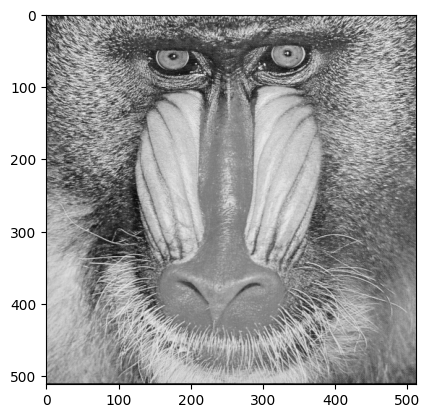

In [ ]:
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/mandrill.tiff')

if img is None:
    raise Exception('Image is not found!')

img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(img_gray, cmap='gray')
plt.show()

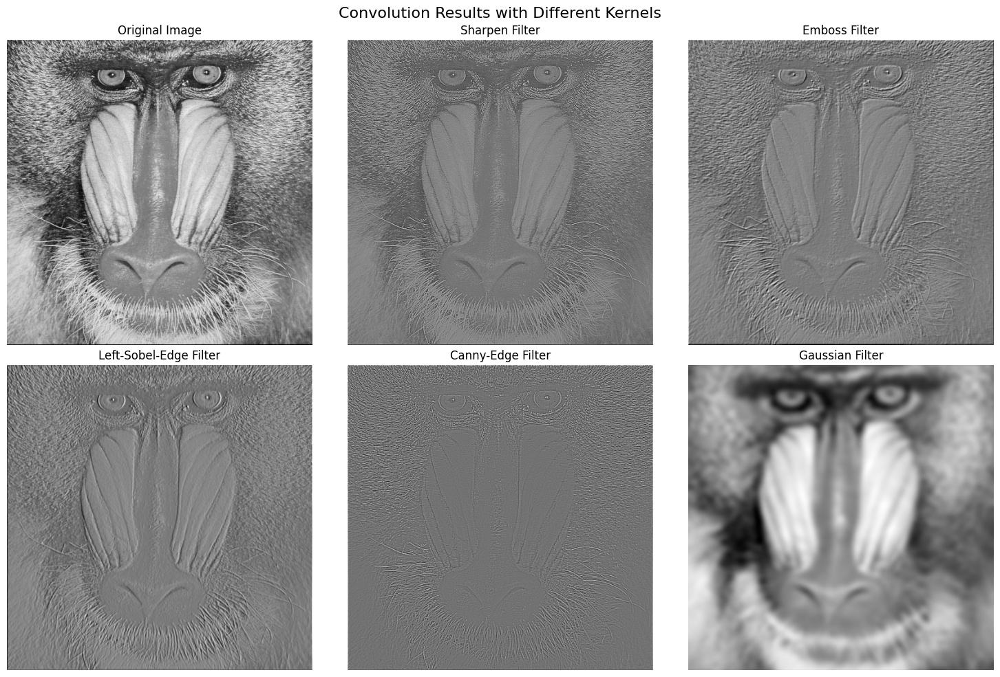

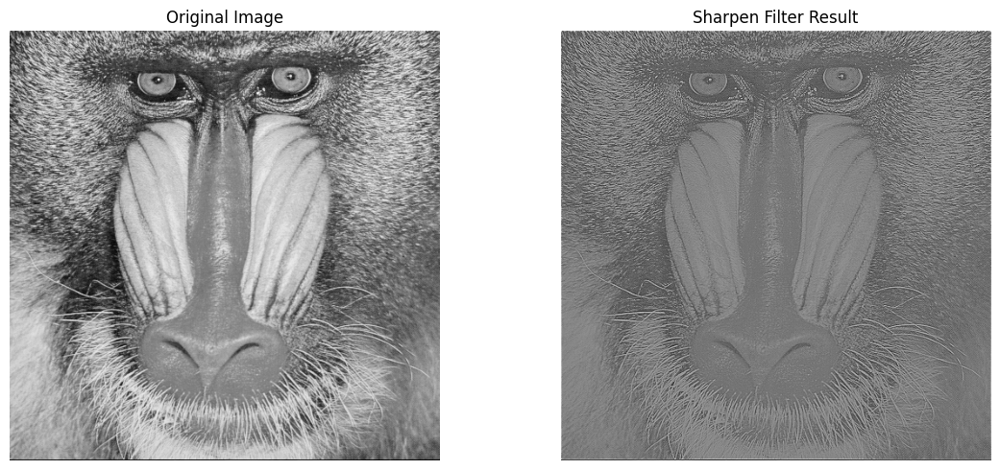

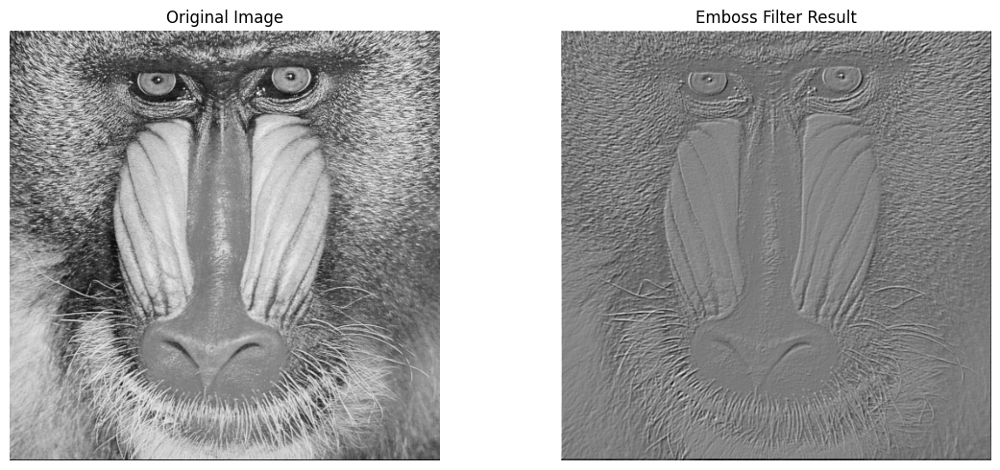

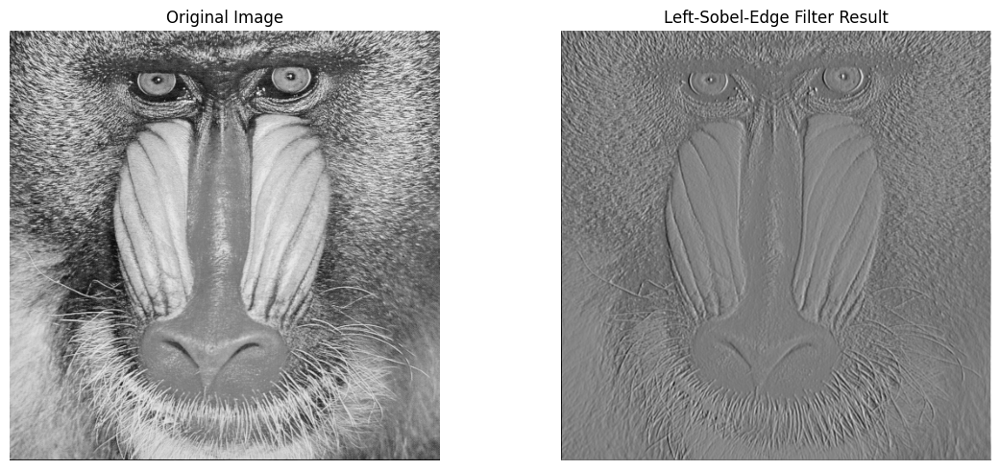

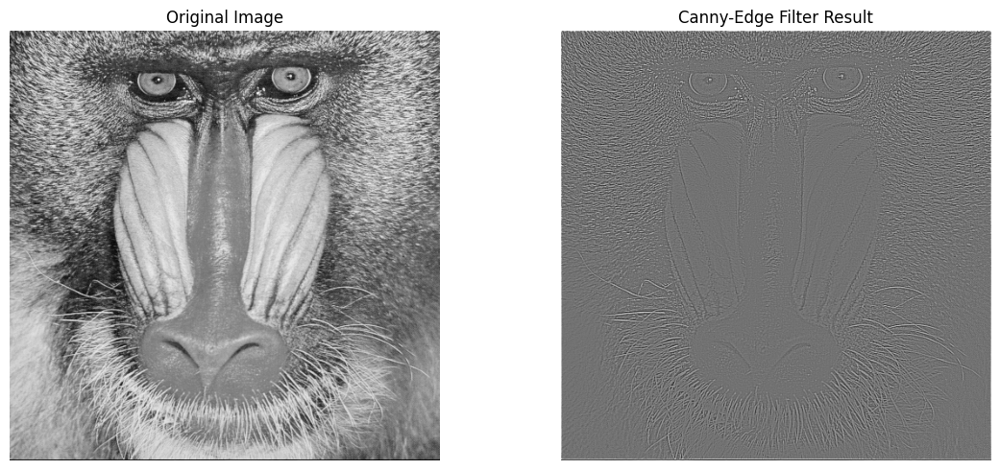

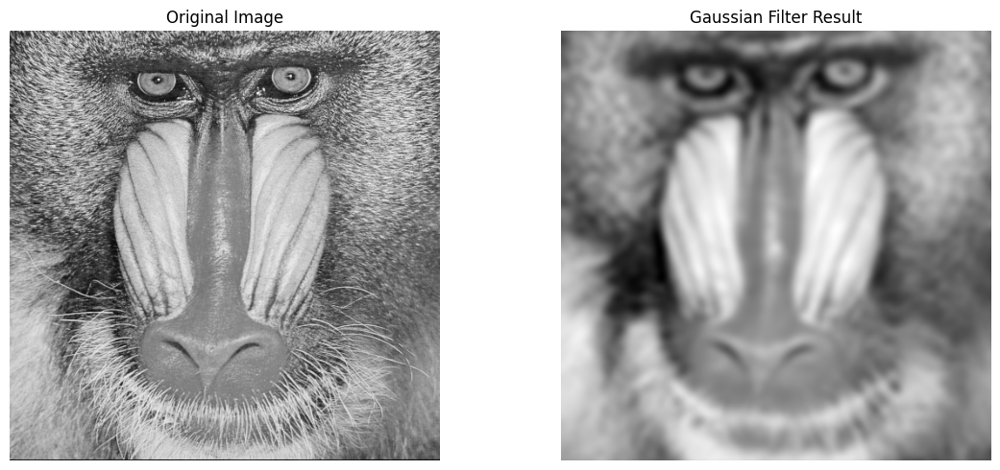

In [ ]:
# Display original image and convolution results from all kernels
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Convolution Results with Different Kernels', fontsize=16)

# Original image
axes[0, 0].imshow(img_gray, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Apply convolution with each kernel and display
kernel_names = list(kernels.keys())
positions = [(0, 1), (0, 2), (1, 0), (1, 1), (1, 2)]

for i, (kernel_name, position) in enumerate(zip(kernel_names, positions)):
    if i < len(kernel_names):
        # Apply convolution
        result = convolution2d(
            image=img_gray,
            kernel=kernels[kernel_name],
            stride=1,
            padding=1
        )

        # Display result
        row, col = position
        axes[row, col].imshow(result, cmap='gray')
        axes[row, col].set_title(f'{kernel_name.title()} Filter')
        axes[row, col].axis('off')

plt.tight_layout()
plt.show()

# Individual detailed view of each kernel result
for kernel_name in kernels.keys():
    result = convolution2d(
        image=img_gray,
        kernel=kernels[kernel_name],
        stride=1,
        padding=1
    )

    plt.figure(figsize=(12, 5))

    # Original
    plt.subplot(1, 2, 1)
    plt.imshow(img_gray, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Convolved result
    plt.subplot(1, 2, 2)
    plt.imshow(result, cmap='gray')
    plt.title(f'{kernel_name.title()} Filter Result')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Praktikum 2

## Percobaan 1:

In [ ]:
#Fungsi tampil berdampingan
def show_side_by_side(
    images: List[np.ndarray],
    titles: List[str],
    figsize: Tuple[int, int] = (15, 5)
) -> None:
    plt.figure(figsize=figsize)

    for i, (img, title) in enumerate(zip(images, titles)):
        if len(img.shape) == 2: # grayscale
            plt.subplot(1, len(images), i+1)
            plt.imshow(img, cmap='gray')
        else:
            plt.subplot(1, len(images), i+1)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

        plt.title(title)
        plt.axis('off')

    plt.show()

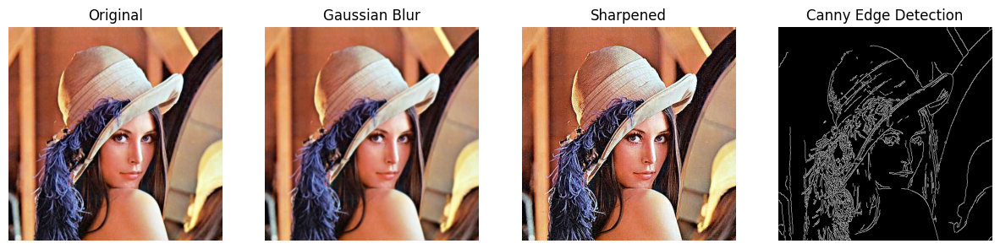

In [ ]:
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/lena.jpg')

if img is None:
    raise Exception('Image is not found!')

img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

blur = cv2.GaussianBlur(img, (7, 7), 1)
edges = cv2.Canny(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), 100, 200)

sharpen_kernel = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0],
])

sharpened = cv2.filter2D(img, -1, sharpen_kernel)

show_side_by_side(
    images=[img, blur, sharpened, edges],
    titles=['Original', 'Gaussian Blur', 'Sharpened', 'Canny Edge Detection']
)

## Percobaan 2:

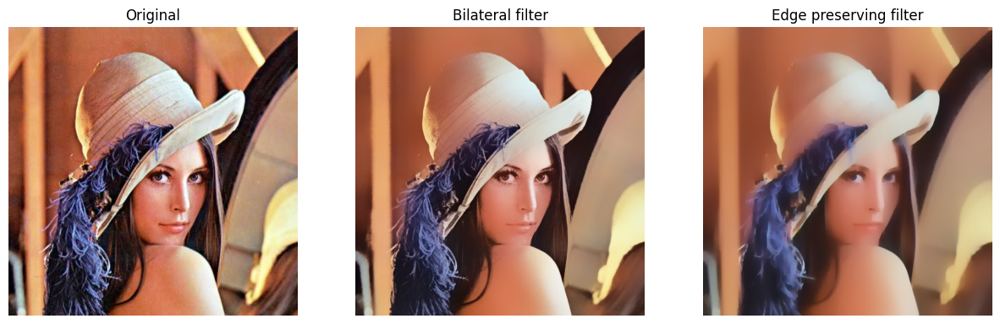

In [ ]:
#Filter Modern dari OpenCV
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/lena.jpg')

if img is None:
    raise Exception('Image is not found!')


bilateral = cv2.bilateralFilter(
    src=img,
    d=50,
    sigmaColor=100,
    sigmaSpace=100
)

edge_preserve = cv2.edgePreservingFilter(
    src=img,
    flags=1,
    sigma_s=100,
    sigma_r=0.9
)

show_side_by_side(
    images=[img, bilateral, edge_preserve],
    titles=['Original', 'Bilateral filter', 'Edge preserving filter']
)

## Percobaan 3:

Menjalankan model CNN...


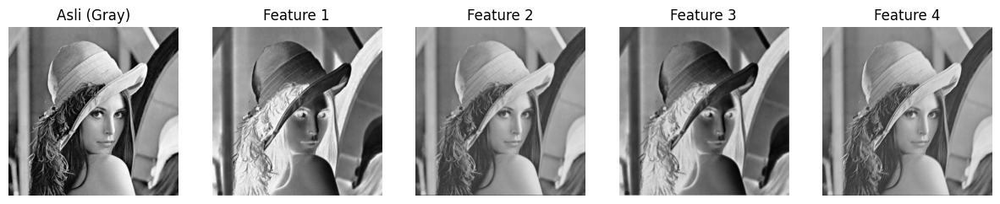

In [ ]:
import torch
import torch.nn as nn
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Fungsi untuk menampilkan gambar secara berdampingan (seperti di soal)
def show_side_by_side(images, titles):
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for i, (img, title) in enumerate(zip(images, titles)):
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(title)
        axes[i].axis('off')
    plt.show()

# 1. Muat gambar dan ubah ke grayscale
path = '/content/drive/MyDrive/PCVK/Images/lena.jpg'
img = cv2.imread(path)

# Periksa apakah gambar berhasil dimuat
if img is None:
    print(f"Error: Gagal memuat gambar dari path: {path}")
else:
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # -------------------------------------------------------------
    # Kode dari soal dimulai di sini
    # -------------------------------------------------------------

    # Filter Feature Map yang digunakan pada CNN, jalankan beberapa kali
    print("Menjalankan model CNN...")

    class SimpleCNN(nn.Module):
        def __init__(self):
            super(SimpleCNN, self).__init__()
            # Lapisan ini membuat 4 filter (kernel) berukuran 3x3
            # Nilai-nilai dalam filter ini diinisialisasi secara acak
            self.conv1 = nn.Conv2d(1, 4, kernel_size=3, stride=1, padding=1)

        def forward(self, x):
            return self.conv1(x)

    # Setiap kali baris ini dieksekusi, model baru dengan filter acak dibuat
    model = SimpleCNN()

    # Ubah gambar ke tensor
    img_tensor = torch.tensor(img_gray, dtype=torch.float32).unsqueeze(0).unsqueeze(0) / 255.0

    # Hasil CNN
    with torch.no_grad():
        features = model(img_tensor)

    # Visualisasi feature maps
    feature_maps = [features[0,i].numpy() for i in range(features.shape[1])]
    show_side_by_side([img_gray] + feature_maps, ["Asli (Gray)"] + [f"Feature {i+1}" for i in range(len(feature_maps))])

## Percobaan 4:

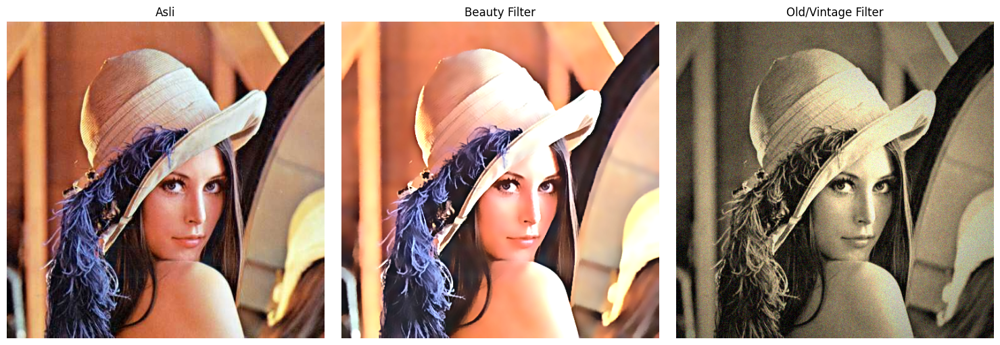

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------------------------------------------------------
# PENTING: Ganti path ini dengan lokasi file gambar 'lena' di komputer Anda.
# Contoh: 'C:/Users/NamaAnda/Downloads/lena.png' atau './lena.png'
# -----------------------------------------------------------------------------
image_path = '/content/drive/MyDrive/PCVK/Images/lena.jpg'
img = cv.imread(image_path)

# Jika gambar tidak berhasil dimuat, hentikan program
if img is None:
    print(f"Error: Tidak dapat memuat gambar dari path: {image_path}")
    print("Pastikan file gambar 'lena.png' ada di lokasi yang benar.")
else:
    # =====================
    # 1. Beauty Filter
    # =====================
    # Step 1: Smoothing Kulit dengan bilateral filter
    smooth = cv.bilateralFilter(img, d=15, sigmaColor=75, sigmaSpace=75)

    # Step 2: Unsharp masking (pertajam mata/bibir)
    gaussian = cv.GaussianBlur(smooth, (0,0), 3)
    sharpened = cv.addWeighted(smooth, 1.5, gaussian, -0.5, 0)

    # Step 3: Brightness & contrast
    alpha = 1.2 # contrast
    beta = 15   # brightness
    beauty_filter_result = cv.convertScaleAbs(sharpened, alpha=alpha, beta=beta)


    # =====================
    # 2. Old/Vintage Filter
    # =====================
    # Step 1: Sepia tone
    sepia_kernel = np.array([[0.272, 0.534, 0.131],
                             [0.349, 0.686, 0.168],
                             [0.393, 0.769, 0.189]])
    sepia = cv.transform(img, sepia_kernel)
    sepia = np.clip(sepia, 0, 255).astype(np.uint8)

    # Step 2: Vignette
    rows, cols = img.shape[:2]
    kernel_x = cv.getGaussianKernel(cols, cols*0.6)
    kernel_y = cv.getGaussianKernel(rows, rows*0.6)
    kernel = kernel_y * kernel_x.T
    mask = kernel / kernel.max()
    vignette = np.copy(sepia)
    for i in range(3):
        vignette[:,:,i] = vignette[:,:,i] * mask

    # Step 3: Noise/Grain
    noise = np.random.normal(0, 15, vignette.shape).astype(np.int16)
    old_vintage_filter_result = np.clip(vignette.astype(np.int16) + noise, 0, 255).astype(np.uint8)


    # ==============================================================
    # BAGIAN UNTUK MENAMPILKAN OUTPUT SEPERTI DI FOTO
    # ==============================================================
    # OpenCV memuat gambar sebagai BGR, Matplotlib menampilkannya sebagai RGB.
    # Kita perlu mengonversi format warnanya agar tampil dengan benar.
    img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    beauty_rgb = cv.cvtColor(beauty_filter_result, cv.COLOR_BGR2RGB)
    old_vintage_rgb = cv.cvtColor(old_vintage_filter_result, cv.COLOR_BGR2RGB)

    # Membuat figure untuk menampung 3 gambar
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Tampilkan gambar Asli
    axes[0].imshow(img_rgb)
    axes[0].set_title('Asli')
    axes[0].axis('off') # Menghilangkan sumbu x dan y

    # Tampilkan gambar Beauty Filter
    axes[1].imshow(beauty_rgb)
    axes[1].set_title('Beauty Filter')
    axes[1].axis('off')

    # Tampilkan gambar Old/Vintage Filter
    axes[2].imshow(old_vintage_rgb)
    axes[2].set_title('Old/Vintage Filter')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

## Percobaan 5:

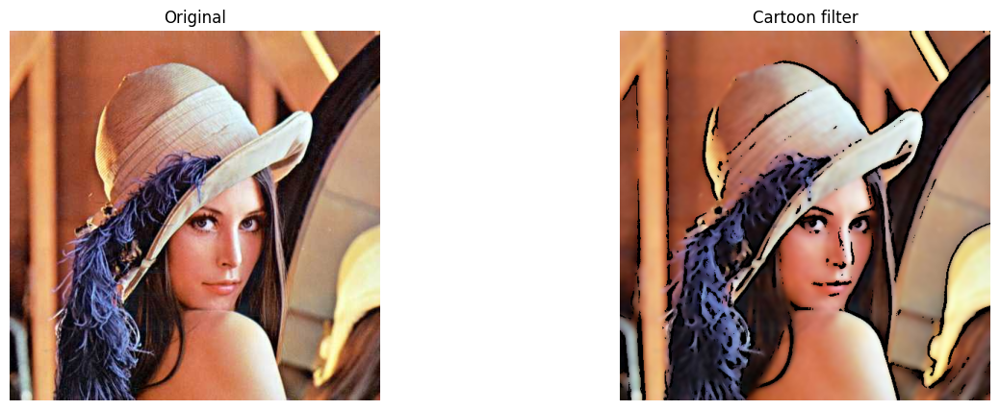

In [ ]:
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/lena.jpg')

if img is None:
    raise Exception('Image is not found!')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray_blur = cv2.medianBlur(gray, 7)

edges = cv2.adaptiveThreshold(
    src=gray_blur,
    maxValue=255,
    adaptiveMethod=cv2.ADAPTIVE_THRESH_MEAN_C,
    thresholdType=cv2.THRESH_BINARY,
    blockSize=9,
    C=9
)

color = cv2.bilateralFilter(img, d=9, sigmaColor=200, sigmaSpace=200)

cartoon = cv2.bitwise_and(color, color, mask=edges)

show_side_by_side(
    images=[img, cartoon],
    titles=['Original', 'Cartoon filter']
)

## Percobaan 6:

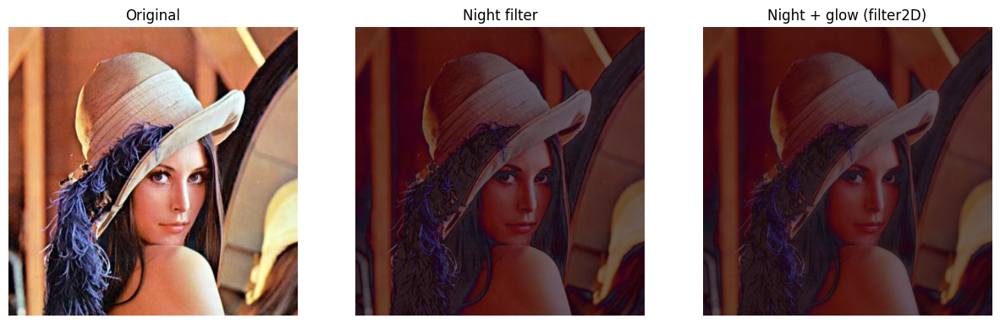

In [ ]:
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/lena.jpg')

if img is None:
    raise Exception('Image is not found!')

night = cv2.convertScaleAbs(img, alpha=0.6, beta=-40)

blue_tint = np.full_like(night, (50, 0, 100))
night = cv2.addWeighted(night, 0.8, blue_tint, 0.2, 0)

kernel = np.ones((15, 15), np.float32) / 255
glow = cv2.filter2D(night, -1, kernel)

night_glow = cv2.addWeighted(night, 0.7, glow, 0.3, 0)

show_side_by_side(
    images=[img, night, night_glow],
    titles=['Original', 'Night filter', 'Night + glow (filter2D)']
)

## Percobaan 7:

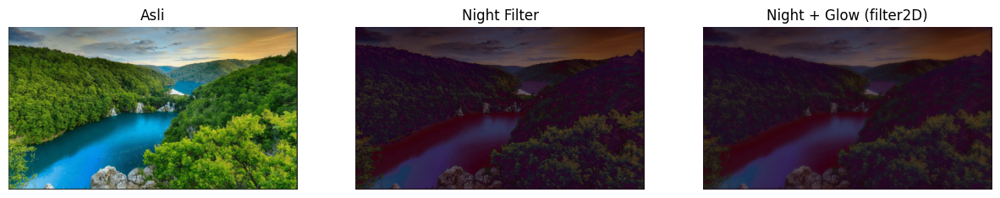

In [ ]:
# Night Filter
img = cv2.imread("/content/drive/MyDrive/PCVK/Images/jungle.png")
if img is None:
    raise Exception("Error: Image not loaded. Check the file path.")

img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# Step 1: Gelapkan (contrast turun, brightness negatif)
night = cv2.convertScaleAbs(img, alpha=0.6, beta=-40)

# Step 2: Tambah bias biru
blue_tint = np.full_like(night, (50, 0, 100)) # BGR
night = cv2.addWeighted(night, 0.8, blue_tint, 0.2, 0)

# Step 3: Efek glow di area terang dengan filter2D (blur kernel)
kernel = np.ones((15,15), np.float32) / 225
glow = cv2.filter2D(night, -1, kernel)

# Kombinasikan asli + glow
night_glow = cv2.addWeighted(night, 0.7, glow, 0.3, 0)

show_side_by_side([img, night, night_glow],
                  ["Asli", "Night Filter", "Night + Glow (filter2D)"])

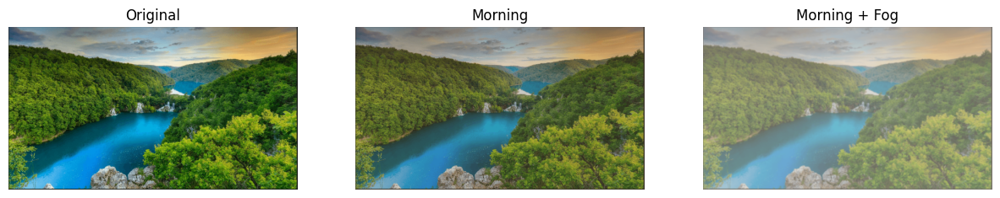

In [ ]:
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/jungle.png')

if img is None:
    raise Exception('Image is not found!')

alpha = 0.9
beta = 20
soft = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)

warm_tint = np.full_like(soft, (40, 70, 120))
morning = cv2.addWeighted(soft, 0.8, warm_tint, 0.2, 0)

kernel = cv2.getGaussianKernel(3, 3)
kernel = kernel @ kernel.T
fog = cv2.filter2D(morning, -1, kernel=kernel)

white_layer = np.full_like(morning, 255)

fog = cv2.addWeighted(fog, 0.7, white_layer, 0.3, 0)

show_side_by_side(
    images=[img, morning, fog],
    titles=['Original', 'Morning', 'Morning + Fog']
)